In [ ]:
"""
Image Stitching Pipeline
========================
Feature detection → RANSAC + LM homography estimation → Covariance-weighted MST
→ GTSAM bundle adjustment → Panorama construction
"""

import cv2
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import gtsam
from gtsam import symbol
from scipy.optimize import least_squares
from itertools import combinations


# ============================================================================
# CONFIGURATION
# ============================================================================

class StitchingParameters:
    """All configurable parameters for the image stitching pipeline."""

    # Feature matching
    MIN_MATCHES        = 10     # Minimum valid matches per edge
    MIN_INLIER_RATIO   = 0.2    # Minimum inlier-to-match ratio
    SIFT_RATIO_THRESHOLD = 0.7  # Lowe's ratio test threshold

    # RANSAC
    RANSAC_REPROJ_THRESHOLD = 5.0   # Max reprojection error (px)
    RANSAC_CONFIDENCE       = 0.99
    RANSAC_MAX_ITERS        = 2000

    # Levenberg-Marquardt optimization
    LM_MAX_NFEV = 1000
    LM_FTOL     = 1e-8
    LM_XTOL     = 1e-8

    # Covariance
    COV_REGULARIZATION = 1e-12  # Regularization for matrix inversion

    # GTSAM bundle adjustment
    GTSAM_PRIOR_SIGMA    = 0.001
    GTSAM_MAX_ITERATIONS = 100
    GTSAM_REL_ERROR_TOL  = 1e-8
    GTSAM_ABS_ERROR_TOL  = 1e-8

    # Visualization
    GRAPH_NODE_SIZE  = 2000
    MAX_DISPLAY_COLS = 3


params = StitchingParameters()


# ============================================================================
# FEATURE DETECTION & MATCHING
# ============================================================================

def find_and_match_features(img1, img2, ratio_threshold=None):
    """Detect SIFT features and match them between two images."""
    if ratio_threshold is None:
        ratio_threshold = params.SIFT_RATIO_THRESHOLD

    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    if des1 is None or des2 is None:
        return [], [], []

    flann = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=50))
    matches = flann.knnMatch(des1, des2, k=2)

    good = [m for m, n in matches if len([m, n]) == 2 and m.distance < ratio_threshold * n.distance]
    return kp1, kp2, good


# ============================================================================
# HOMOGRAPHY ESTIMATION
# ============================================================================

def homography_residuals(params_vec, src_pts, dst_pts):
    """Compute per-point reprojection residuals for a homography."""
    H = np.array([
        [params_vec[0], params_vec[1], params_vec[2]],
        [params_vec[3], params_vec[4], params_vec[5]],
        [params_vec[6], params_vec[7], 1.0],
    ])
    src_hom = np.column_stack([src_pts, np.ones(len(src_pts))])
    proj = (H @ src_hom.T).T
    proj_cart = proj[:, :2] / proj[:, [2]]
    return (proj_cart - dst_pts).flatten()


def compute_covariance_matrix(lm_result, src_pts, dst_pts):
    """Estimate the covariance matrix from a least-squares result via J^T J."""
    try:
        J = lm_result.jac
        residuals = homography_residuals(lm_result.x, src_pts, dst_pts)

        dof = 2 * len(src_pts) - len(lm_result.x)
        sigma2 = np.sum(residuals ** 2) / dof if dof > 0 else 1.0

        JTJ = J.T @ J + params.COV_REGULARIZATION * np.eye(J.shape[1])
        try:
            cov = sigma2 * np.linalg.inv(JTJ)
        except np.linalg.LinAlgError:
            cov = sigma2 * np.linalg.pinv(JTJ)
        return cov

    except Exception as e:
        print(f"Warning: Could not compute covariance: {e}")
        return np.eye(8)


def optimize_homography_lm(src_pts, dst_pts, initial_h=None):
    """Refine a homography with Levenberg-Marquardt and return its covariance."""
    if len(src_pts) < 4:
        return None, None, None

    if initial_h is None:
        initial_h = cv2.findHomography(
            src_pts.reshape(-1, 1, 2), dst_pts.reshape(-1, 1, 2), cv2.LMEDS)[0]
    if initial_h is None:
        return None, None, None

    result = least_squares(
        homography_residuals, initial_h.flatten()[:8],
        args=(src_pts, dst_pts), method='trf',
        max_nfev=params.LM_MAX_NFEV, ftol=params.LM_FTOL, xtol=params.LM_XTOL,
    )

    if not result.success:
        return initial_h, result, None

    H_opt = np.array([
        [result.x[0], result.x[1], result.x[2]],
        [result.x[3], result.x[4], result.x[5]],
        [result.x[6], result.x[7], 1.0],
    ])
    cov = compute_covariance_matrix(result, src_pts, dst_pts)
    return H_opt, result, cov


def estimate_homography_ransac_lm(kp1, kp2, matches, min_matches=None, img1_shape=None, img2_shape=None):
    """Estimate homography via RANSAC followed by LM refinement with covariance."""
    if min_matches is None:
        min_matches = params.MIN_MATCHES
    if len(matches) < min_matches:
        return None, [], None, None, None

    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    H_ransac, mask = cv2.findHomography(
        src_pts, dst_pts, cv2.RANSAC,
        ransacReprojThreshold=params.RANSAC_REPROJ_THRESHOLD,
        confidence=params.RANSAC_CONFIDENCE,
        maxIters=params.RANSAC_MAX_ITERS,
    )
    if mask is None or H_ransac is None:
        return None, [], None, None, None

    valid, reason = validate_homography_matrix(H_ransac)
    if not valid:
        print(f"Warning: RANSAC homography failed validation: {reason}")
        return None, [], None, None, None

    inliers = [matches[i] for i in range(len(matches)) if mask[i]]
    inlier_src = np.array([kp1[m.queryIdx].pt for m in inliers])
    inlier_dst = np.array([kp2[m.trainIdx].pt for m in inliers])

    if len(inlier_src) < 4:
        print(f"Warning: Not enough inliers for LM optimization: {len(inlier_src)}")
        return None, [], None, None, None

    H_lm, lm_result, cov = optimize_homography_lm(inlier_src, inlier_dst, H_ransac)

    if H_lm is not None:
        valid, reason = validate_homography_matrix(H_lm)
        if not valid:
            print(f"Warning: Optimized homography failed validation: {reason}")
            H_lm, cov = H_ransac, None
        elif img1_shape is not None:
            ok, reason = test_homography_on_corners(H_lm, img1_shape)
            if not ok:
                print(f"Warning: Exploding transformation: {reason}")
                H_lm, cov = H_ransac, None

    return H_lm, inliers, lm_result, mask, cov


# ============================================================================
# HOMOGRAPHY VALIDATION
# ============================================================================

def validate_homography_matrix(H, min_det=1e-6, max_det=1e6, max_cond=1e12):
    """Check a homography for numerical stability and geometric sanity."""
    if H is None:
        return False, "Matrix is None"

    det = np.linalg.det(H)
    if abs(det) < min_det: return False, f"Determinant too small: {det:.2e}"
    if abs(det) > max_det: return False, f"Determinant too large: {det:.2e}"

    try:
        cond = np.linalg.cond(H)
        if cond > max_cond: return False, f"Condition number too large: {cond:.2e}"
    except Exception:
        return False, "Cannot compute condition number"

    if abs(H[2, 2]) < 1e-6:
        return False, f"h33 too small: {H[2,2]:.2e}"

    sx = np.sqrt(H[0, 0] ** 2 + H[0, 1] ** 2)
    sy = np.sqrt(H[1, 0] ** 2 + H[1, 1] ** 2)
    if not (0.1 <= sx <= 10): return False, f"X scale unreasonable: {sx:.2f}"
    if not (0.1 <= sy <= 10): return False, f"Y scale unreasonable: {sy:.2f}"

    if abs(H[0, 2]) > 10000: return False, f"X translation too large: {H[0,2]:.1f}"
    if abs(H[1, 2]) > 10000: return False, f"Y translation too large: {H[1,2]:.1f}"

    if abs(H[2, 0]) > 1e-3: return False, f"X perspective too large: {H[2,0]:.2e}"
    if abs(H[2, 1]) > 1e-3: return False, f"Y perspective too large: {H[2,1]:.2e}"

    try:
        R = H[:2, :2] / np.sqrt(sx * sy)
        err = np.linalg.norm(R @ R.T - np.eye(2))
        if err > 0.1: return False, f"Not a proper rotation: error={err:.3f}"
    except Exception:
        return False, "Cannot extract rotation"

    return True, "Valid"


def test_homography_on_corners(H, img_shape):
    """Reject homographies that map image corners to extreme coordinates."""
    if H is None:
        return False, "No homography"

    h, w = img_shape[:2]
    corners = np.array([[0,0],[w,0],[w,h],[0,h]], dtype=np.float32)
    try:
        proj = (H @ np.column_stack([corners, np.ones(4)]).T).T
        pts = proj[:, :2] / proj[:, [2]]

        if np.any(np.abs(pts) > 50000):
            i = np.argmax(np.abs(pts).max(axis=1))
            return False, f"Corner {i} explodes to {pts[i]}"

        def area(p):
            x, y = p[:,0], p[:,1]
            return 0.5 * abs(sum(x[i]*y[(i+1)%len(x)] - x[(i+1)%len(x)]*y[i] for i in range(len(x))))

        ratio = area(pts) / (w * h)
        if not (0.01 <= ratio <= 100):
            return False, f"Area ratio extreme: {ratio:.2f}"

        return True, "Valid"
    except Exception as e:
        return False, f"Transformation failed: {e}"


# ============================================================================
# HOMOGRAPHY QUALITY
# ============================================================================

def compute_homography_quality_score(H, src_pts, dst_pts):
    """Score a homography by reprojection accuracy weighted by point count."""
    if H is None or src_pts is None or dst_pts is None:
        return 0.0
    try:
        proj = (H @ np.column_stack([src_pts, np.ones(len(src_pts))]).T).T
        cart = proj[:, :2] / proj[:, [2]]
        mean_err = np.mean(np.linalg.norm(cart - dst_pts, axis=1))
        return len(src_pts) / (1.0 + mean_err)
    except Exception:
        return 0.0


def compute_covariance_weight(covariance):
    """Convert covariance to a scalar weight (lower uncertainty → higher weight)."""
    if covariance is None:
        return float('inf')
    return 1.0 / (np.trace(covariance) + 1e-12)


# ============================================================================
# PAIRWISE MATCHING & SPANNING TREE
# ============================================================================

def find_all_pairwise_matches(images, min_matches=None, min_inlier_ratio=None):
    """
    Match all image pairs, build a covariance-weighted graph,
    and return the maximum spanning tree together with all valid pairs.
    """
    if min_matches is None:     min_matches = params.MIN_MATCHES
    if min_inlier_ratio is None: min_inlier_ratio = params.MIN_INLIER_RATIO

    print(f"Analyzing {len(images)} images  "
          f"(min_matches={min_matches}, min_inlier_ratio={min_inlier_ratio:.1%})")

    pairwise_data = {}
    full_graph = nx.Graph()
    for i, (img_num, _, _) in enumerate(images):
        full_graph.add_node(i, image_num=img_num)

    covariance_weights = {}
    all_inlier_ratios = []

    for i, j in combinations(range(len(images)), 2):
        img1_num, img1, _ = images[i]
        img2_num, img2, _ = images[j]

        kp1, kp2, matches = find_and_match_features(img1, img2)
        if len(matches) < min_matches:
            continue

        H, inliers, lm_result, mask, cov = estimate_homography_ransac_lm(
            kp1, kp2, matches, min_matches, img1.shape, img2.shape)
        if H is None or lm_result is None:
            continue

        inlier_ratio = len(inliers) / len(matches)
        all_inlier_ratios.append(inlier_ratio)
        if inlier_ratio < min_inlier_ratio:
            continue

        inlier_src = np.array([kp1[m.queryIdx].pt for m in inliers])
        inlier_dst = np.array([kp2[m.trainIdx].pt for m in inliers])
        error = np.mean(np.abs(homography_residuals(H.flatten()[:8], inlier_src, inlier_dst)))
        quality = compute_homography_quality_score(H, inlier_src, inlier_dst)

        if quality <= 1.0:
            print(f"Rejected Img{img1_num}↔Img{img2_num}: quality too low ({quality:.2f})")
            continue

        pairwise_data[(i, j)] = {
            'homography': H, 'matches': len(matches), 'inliers': len(inliers),
            'inlier_ratio': inlier_ratio, 'error': error,
            'keypoints': (kp1, kp2), 'inlier_matches': inliers,
            'covariance': cov, 'lm_result': lm_result, 'quality_score': quality,
        }

        cov_weight = compute_covariance_weight(cov)
        covariance_weights[(i, j)] = cov_weight
        uncertainty = np.trace(cov) if cov is not None else float('inf')
        full_graph.add_edge(i, j,
            weight=-cov_weight, error=error, homography=H,
            inliers=len(inliers), covariance=cov,
            uncertainty=uncertainty, covariance_weight=cov_weight)

    print(f"Found {len(pairwise_data)} valid pairs")

    if all_inlier_ratios:
        _plot_inlier_ratio_histogram(all_inlier_ratios, min_inlier_ratio, len(pairwise_data))

    if pairwise_data:
        show_full_connection_graph(images, pairwise_data)

    if covariance_weights:
        _print_weight_stats(covariance_weights)

    if full_graph.number_of_edges() == 0:
        return {}, {}, nx.Graph()

    # Connected components
    components = list(nx.connected_components(full_graph))
    print(f"\nConnected components: {len(components)}")
    for k, comp in enumerate(components):
        print(f"  [{k+1}] {len(comp)} images: {[images[idx][0] for idx in comp]}")

    largest_cc = max(components, key=len)
    isolated = set(range(len(images))) - set().union(*components)
    if isolated:
        print(f"Isolated images: {[images[i][0] for i in isolated]}")

    subgraph = full_graph.subgraph(largest_cc).copy()
    mst = nx.minimum_spanning_tree(subgraph, weight='weight')

    mst_data = {k: pairwise_data[k] for k in (tuple(sorted(e)) for e in mst.edges()) if k in pairwise_data}
    print(f"MST: {mst.number_of_edges()} edges selected")

    _print_mst_edges(mst, covariance_weights, mst_data, images)
    return pairwise_data, mst_data, mst


# -- helpers -----------------------------------------------------------------

def _plot_inlier_ratio_histogram(ratios, threshold, n_included):
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.hist(ratios, bins=50, alpha=0.7, color='skyblue', edgecolor='black')
    ax.axvline(threshold, color='red',   ls='--', lw=2, label=f'Threshold: {threshold:.1%}')
    ax.axvline(np.mean(ratios),   color='green',  lw=2, label=f'Mean: {np.mean(ratios):.1%}')
    ax.axvline(np.median(ratios), color='orange', lw=2, label=f'Median: {np.median(ratios):.1%}')
    ax.set_title(f'Inlier Ratio Distribution  (total pairs: {len(ratios)})', fontsize=14, fontweight='bold')
    ax.set_xlabel('Inlier Ratio'); ax.set_ylabel('Pairs'); ax.legend(); ax.grid(alpha=0.3)

    stats = (f"Mean: {np.mean(ratios):.3f}\nMedian: {np.median(ratios):.3f}\n"
             f"Std: {np.std(ratios):.3f}\nMin: {min(ratios):.3f}\nMax: {max(ratios):.3f}\n\n"
             "Pairs by threshold:\n" +
             "\n".join(f"{t:.0%}: {sum(1 for r in ratios if r >= t)}"
                       for t in [0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]))
    ax.text(0.02, 0.98, stats, transform=ax.transAxes, fontsize=10, va='top',
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8))
    plt.tight_layout(); plt.show()

    print(f"\n{'='*60}\nINLIER RATIO ANALYSIS\n{'='*60}")
    print(f"Total pairs: {len(ratios)}  |  Included at {threshold:.1%}: {n_included}")
    print(f"Mean: {np.mean(ratios):.1%}  Median: {np.median(ratios):.1%}  Std: {np.std(ratios):.1%}")
    for t in [0.1, 0.15, 0.2, 0.25, 0.3]:
        c = sum(1 for r in ratios if r >= t)
        if c > n_included:
            print(f"Threshold {t:.0%} would include {c} pairs (+{c - n_included})")


def _print_weight_stats(weights):
    arr = np.array(list(weights.values()))
    finite = arr[np.isfinite(arr)]
    if len(finite):
        print(f"\nCovariance Weight Stats:  mean={np.mean(finite):.2e}  "
              f"std={np.std(finite):.2e}  min={np.min(finite):.2e}  max={np.max(finite):.2e}  "
              f"inf={len(arr)-len(finite)}")


def _print_mst_edges(mst, cov_weights, mst_data, images):
    edges = []
    for e in mst.edges():
        k = tuple(sorted(e))
        w = cov_weights.get(k, 0)
        cov = mst_data[k]['covariance'] if k in mst_data else None
        u = np.trace(cov) if cov is not None else float('inf')
        edges.append((k, w, u, images[e[0]][0], images[e[1]][0]))
    edges.sort(key=lambda x: x[1], reverse=True)
    print("\nMST edges (by weight):")
    for rank, (k, w, u, a, b) in enumerate(edges, 1):
        print(f"  {rank}. Img{a}↔Img{b}:  weight={w:.2e}  uncertainty={u:.2e}")


# ============================================================================
# GRAPH VISUALIZATION
# ============================================================================

def show_full_connection_graph(images, pairwise_data):
    """Visualize all valid image pairs before MST selection."""
    fig, ax = plt.subplots(figsize=(16, 12))

    G = nx.Graph()
    for i, (n, _, _) in enumerate(images): G.add_node(i, image_num=n)
    for (i, j), d in pairwise_data.items():
        w = compute_covariance_weight(d.get('covariance'))
        u = np.trace(d['covariance']) if d.get('covariance') is not None else float('inf')
        G.add_edge(i, j, weight=w, error=d['error'], homography=d['homography'],
                   inliers=d['inliers'], uncertainty=u)

    pos = nx.circular_layout(G, scale=3) if len(G) <= 6 else nx.spring_layout(G, seed=42, k=4, iterations=100, scale=3)
    node_labels = {i: f"Image {images[i][0]}" for i in range(len(images))}

    edge_widths, edge_labels, raw_weights = [], {}, []
    for i, j in G.edges():
        k = tuple(sorted([i,j]))
        d = pairwise_data[k]
        w = compute_covariance_weight(d.get('covariance'))
        raw_weights.append(w if np.isfinite(w) else 0)
        edge_labels[(i,j)] = f"M: {d['inliers']}\nE: {d['error']:.1f}px"
        edge_widths.append(max(1, min(6, d['inliers'] / 25)))

    edge_colors = _normalize_edge_colors(raw_weights, plt.cm.viridis)

    nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=edge_widths, alpha=0.6, ax=ax)
    _draw_nodes(G, pos, ax, images, 'lightcoral', 'darkred', params.GRAPH_NODE_SIZE)
    _draw_edge_labels(G, pos, ax, edge_labels)

    stats = (f"Full Graph Stats:\n• Nodes: {G.number_of_nodes()}\n• Edges: {G.number_of_edges()}\n"
             f"• Possible: {len(images)*(len(images)-1)//2}\n"
             f"• Connection rate: {100*G.number_of_edges()/(len(images)*(len(images)-1)//2):.1f}%\n"
             f"• Min matches: {params.MIN_MATCHES}")
    ax.text(0.02, 0.98, stats, transform=ax.transAxes, ha='left', va='top', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.9, edgecolor='blue'))

    ax.set_title('Full Connection Graph (All Valid Pairs)\nBefore MST Selection',
                 fontsize=16, fontweight='bold', pad=20,
                 bbox=dict(boxstyle='round,pad=0.5', facecolor='lightyellow', alpha=0.9))
    ax.set_aspect('equal'); ax.axis('off'); plt.tight_layout(); plt.show()


def show_connection_graph(images, pairwise_data, graph):
    """Visualize the covariance-weighted MST."""
    fig, ax = plt.subplots(figsize=(16, 12))
    pos = (nx.circular_layout(graph, scale=3) if len(graph) <= 6
           else nx.spring_layout(graph, seed=42, k=4, iterations=100, scale=3))

    edge_widths, edge_labels, raw_weights = [], {}, []
    for i, j in graph.edges():
        k = tuple(sorted([i,j]))
        d = pairwise_data.get(k, {})
        cov = d.get('covariance')
        w = compute_covariance_weight(cov) if cov is not None else 0
        raw_weights.append(w if np.isfinite(w) else 0)
        edge_widths.append(max(2, min(8, d.get('inliers', 0) / 20)))
        edge_labels[(i,j)] = (f"Matches: {d.get('inliers',0)}\n"
                               f"Weight: {w:.1e}\nError: {d.get('error',0):.1f}px")

    cmap = plt.cm.plasma_r
    edge_colors = _normalize_edge_colors(raw_weights, cmap)
    nx.draw_networkx_edges(graph, pos, edge_color=edge_colors, width=edge_widths, alpha=0.8, ax=ax)
    _draw_nodes(graph, pos, ax, images, 'lightsteelblue', 'navy', 2500)

    for (i,j), label in edge_labels.items():
        x1,y1 = pos[i]; x2,y2 = pos[j]
        mx,my = (x1+x2)/2, (y1+y2)/2
        dx,dy = x2-x1, y2-y1; L = np.hypot(dx,dy)
        if L > 0:
            px,py = -dy/L*0.3, dx/L*0.3
        else:
            px=py=0
        ax.text(mx+px, my+py, label, ha='center', va='center', fontsize=7,
                bbox=dict(boxstyle='round,pad=0.4', facecolor='lightyellow', edgecolor='orange', alpha=0.9))

    finite_w = [w for w in raw_weights if w > 0 and np.isfinite(w)]
    if len(finite_w) > 1:
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(min(finite_w), max(finite_w)))
        sm.set_array([])
        cb = plt.colorbar(sm, ax=ax, shrink=0.6, aspect=20, pad=0.02)
        cb.set_label('Covariance Weight\n(Higher = More Reliable)', fontsize=10, fontweight='bold')

    ax.legend(handles=[
        plt.Line2D([0],[0], color='purple', lw=4, alpha=0.8, label='Low Weight (High Uncertainty)'),
        plt.Line2D([0],[0], color='yellow', lw=4, alpha=0.8, label='High Weight (Low Uncertainty)'),
    ], loc='upper left', fontsize=9, frameon=True, fancybox=True, shadow=True)

    if pairwise_data:
        finite_w2 = [compute_covariance_weight(d['covariance']) for d in pairwise_data.values()
                     if d.get('covariance') is not None and np.isfinite(compute_covariance_weight(d['covariance']))]
        stats = (f"Graph Stats:\n• Nodes: {graph.number_of_nodes()}\n• Edges: {graph.number_of_edges()}\n"
                 f"• Min matches: {params.MIN_MATCHES}\n")
        if finite_w2:
            stats += (f"• Weight range: {min(finite_w2):.1e}–{max(finite_w2):.1e}\n"
                      f"• Avg inliers: {np.mean([d['inliers'] for d in pairwise_data.values()]):.1f}")
        ax.text(0.98, 0.02, stats, transform=ax.transAxes, ha='right', va='bottom', fontsize=8,
                bbox=dict(boxstyle='round,pad=0.5', facecolor='lightcyan', alpha=0.9, edgecolor='teal'))

    ax.set_title('Covariance-Weighted Maximum Spanning Tree', fontsize=12, fontweight='bold', pad=15,
                 bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgray', alpha=0.8))
    ax.set_aspect('equal'); ax.axis('off'); plt.tight_layout(); plt.show()


# -- graph drawing helpers ---------------------------------------------------

def _normalize_edge_colors(raw_weights, cmap):
    finite = [w for w in raw_weights if w > 0 and np.isfinite(w)]
    if len(finite) > 1:
        lo, hi = min(finite), max(finite)
        norm = [(w-lo)/(hi-lo) if (np.isfinite(w) and w > 0) else 0 for w in raw_weights]
    else:
        norm = [1.0 if (np.isfinite(w) and w > 0) else 0 for w in raw_weights]
    return [cmap(n) for n in norm]


def _draw_nodes(G, pos, ax, images, node_color, edge_color, size):
    shadow_pos = {n: (x+0.05, y-0.05) for n,(x,y) in pos.items()}
    nx.draw_networkx_nodes(G, shadow_pos, node_color='black', node_size=size, alpha=0.3, ax=ax)
    nx.draw_networkx_nodes(G, pos, node_color=node_color, node_size=size, alpha=0.9,
                           edgecolors=edge_color, linewidths=2, ax=ax)
    for node,(x,y) in pos.items():
        ax.text(x, y, f"Image {images[node][0]}", ha='center', va='center',
                fontsize=9, fontweight='bold', color='white')


def _draw_edge_labels(G, pos, ax, edge_labels):
    for (i,j), label in edge_labels.items():
        x1,y1 = pos[i]; x2,y2 = pos[j]
        ax.text((x1+x2)/2, (y1+y2)/2, label, ha='center', va='center', fontsize=8,
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))


# ============================================================================
# TRANSFORM COMPUTATION
# ============================================================================

def compute_absolute_transforms(ref_idx, connected_indices, pairwise_data, graph, images, debug=True):
    """BFS from reference to accumulate absolute homographies for all images."""
    if debug:
        print(f"Computing transforms to Img{images[ref_idx][0]} (reference)")

    transforms = {ref_idx: np.eye(3)}
    visited = {ref_idx}
    queue = [(ref_idx, np.eye(3))]

    while queue:
        cur, cur_H = queue.pop(0)
        for nb in graph.neighbors(cur):
            if nb in visited: continue
            k = tuple(sorted([cur, nb]))
            if k not in pairwise_data: continue
            H_pair = pairwise_data[k]['homography']
            step = np.linalg.inv(H_pair) if k[0] == cur else H_pair
            nb_H = cur_H @ step
            transforms[nb] = nb_H
            visited.add(nb)
            queue.append((nb, nb_H))

    if debug:
        print(f"Computed transforms for {len(transforms)} images")
    return transforms


def compute_image_positions(images, transforms, ref_idx):
    """Map each image centre into panorama coordinates."""
    positions = {}
    ref_img = images[ref_idx][1]
    h, w = ref_img.shape[:2]
    positions[ref_idx] = (w / 2, h / 2)

    for idx, H in transforms.items():
        if idx == ref_idx: continue
        img = images[idx][1]
        ih, iw = img.shape[:2]
        corners = np.array([[0,0],[iw,0],[iw,ih],[0,ih]], dtype=np.float32)
        proj = (H @ np.column_stack([corners, np.ones(4)]).T).T
        cart = proj[:, :2] / proj[:, [2]]
        positions[idx] = (float(np.mean(cart[:,0])), float(np.mean(cart[:,1])))

    return positions


# ============================================================================
# PANORAMA BUILDING
# ============================================================================

def stitch_images(images, transforms, ref_idx):
    """Warp and composite all images onto a common canvas."""
    ref_img = images[ref_idx][1]
    h_ref, w_ref = ref_img.shape[:2]
    all_corners = [[0,0],[w_ref,0],[w_ref,h_ref],[0,h_ref]]

    for idx, H in transforms.items():
        if idx == ref_idx: continue
        img = images[idx][1]
        ih, iw = img.shape[:2]
        corners = np.array([[0,0],[iw,0],[iw,ih],[0,ih]])
        proj = (H @ np.column_stack([corners, np.ones(4)]).T).T
        all_corners.extend((proj[:,:2] / proj[:,[2]]).tolist())

    gc = np.array(all_corners)
    min_x, min_y = np.floor(gc.min(0)).astype(int)
    max_x, max_y = np.ceil(gc.max(0)).astype(int)
    canvas_w, canvas_h = max_x - min_x, max_y - min_y
    T = np.array([[1,0,-min_x],[0,1,-min_y],[0,0,1]], dtype=np.float32)

    result = np.zeros((canvas_h, canvas_w), dtype=np.uint8)
    for idx in sorted(transforms.keys()):
        img = images[idx][1]
        H_final = T @ (transforms[idx] if idx != ref_idx else np.eye(3))
        warped = cv2.warpPerspective(img, H_final, (canvas_w, canvas_h))
        result[warped > 0] = warped[warped > 0]
    return result


def build_panorama_progressive(images, pairwise_data, graph):
    """Build and display the panorama incrementally, one image at a time."""
    if not pairwise_data: return None

    largest_cc = max(nx.connected_components(graph), key=len)
    if len(largest_cc) < 2: return None

    degrees = dict(graph.degree())
    endpoints = [n for n in largest_cc if degrees[n] == 1]
    start_idx = endpoints[0] if len(endpoints) >= 2 else max(largest_cc, key=lambda x: degrees[x])
    print(f"Progressive build starting from Image {images[start_idx][0]}")

    transforms = {start_idx: np.eye(3)}
    order, visited = [start_idx], {start_idx}
    queue = [(start_idx, np.eye(3))]

    while queue:
        cur, cur_H = queue.pop(0)
        for nb in graph.neighbors(cur):
            if nb in visited: continue
            k = tuple(sorted([cur, nb]))
            if k not in pairwise_data: continue
            H_pair = pairwise_data[k]['homography']
            step = np.linalg.inv(H_pair) if k[0] == cur else H_pair
            nb_H = cur_H @ step
            transforms[nb] = nb_H
            visited.add(nb); order.append(nb); queue.append((nb, nb_H))

    print(f"Traversal order: {[images[i][0] for i in order]}")
    if len(order) < 2: return None

    # Canvas bounds
    all_corners = []
    for idx in order:
        img = images[idx][1]; ih, iw = img.shape[:2]
        corners = np.array([[0,0],[iw,0],[iw,ih],[0,ih]])
        proj = (transforms[idx] @ np.column_stack([corners,np.ones(4)]).T).T
        all_corners.extend((proj[:,:2]/proj[:,[2]]).tolist())
    gc = np.array(all_corners)
    min_x, min_y = np.floor(gc.min(0)).astype(int)
    max_x, max_y = np.ceil(gc.max(0)).astype(int)
    canvas_w, canvas_h = max_x-min_x, max_y-min_y
    T = np.array([[1,0,-min_x],[0,1,-min_y],[0,0,1]], dtype=np.float32)

    n = len(order)
    n_cols = min(params.MAX_DISPLAY_COLS, n)
    n_rows = (n + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 4*n_rows))
    axes = np.array(axes).flatten() if n > 1 else [axes]

    canvas = np.zeros((canvas_h, canvas_w), dtype=np.uint8)
    for step, idx in enumerate(order):
        warped = cv2.warpPerspective(images[idx][1], T @ transforms[idx], (canvas_w, canvas_h))
        canvas[warped > 0] = warped[warped > 0]
        axes[step].imshow(canvas.copy(), cmap='gray'); axes[step].axis('off')
    for i in range(n, len(axes)): axes[i].set_visible(False)

    plt.suptitle('Progressive Panorama Building', fontsize=10, fontweight='bold')
    plt.tight_layout(); plt.show()
    return canvas


def build_panorama_final(images, pairwise_data, graph):
    """Build the final panorama without step-by-step visualization."""
    if not pairwise_data: return None, None, None

    largest_cc = max(nx.connected_components(graph), key=len)
    if len(largest_cc) < 2: return None, None, None

    degrees = dict(graph.degree())
    ref_idx = max(largest_cc, key=lambda x: degrees[x])
    transforms = compute_absolute_transforms(ref_idx, largest_cc, pairwise_data, graph, images, debug=False)

    if len([i for i in largest_cc if i in transforms]) < 2:
        return None, None, None

    return stitch_images(images, transforms, ref_idx), transforms, ref_idx


def build_panorama_with_gtsam(images, transforms, title="GTSAM-Optimized Panorama"):
    """Composite a panorama from GTSAM-optimised global transforms."""
    if not transforms: return None

    ref_idx = min(transforms, key=lambda x: np.linalg.norm(transforms[x] - np.eye(3)))
    all_corners = []
    for idx, H in transforms.items():
        img = images[idx][1]; ih, iw = img.shape[:2]
        corners = np.array([[0,0],[iw,0],[iw,ih],[0,ih]])
        proj = (H @ np.column_stack([corners,np.ones(4)]).T).T
        all_corners.extend((proj[:,:2]/proj[:,[2]]).tolist())

    gc = np.array(all_corners)
    min_x,min_y = np.floor(gc.min(0)).astype(int)
    max_x,max_y = np.ceil(gc.max(0)).astype(int)
    T = np.array([[1,0,-min_x],[0,1,-min_y],[0,0,1]], dtype=np.float32)

    canvas = np.zeros((max_y-min_y, max_x-min_x), dtype=np.uint8)
    for idx in sorted(transforms):
        warped = cv2.warpPerspective(images[idx][1], T @ transforms[idx], (max_x-min_x, max_y-min_y))
        canvas[warped > 0] = warped[warped > 0]

    plt.figure(figsize=(16,8)); plt.imshow(canvas, cmap='gray')
    plt.title(title, fontsize=12, fontweight='bold'); plt.axis('off')
    plt.tight_layout(); plt.show()
    return canvas


def build_panorama_with_updated_homographies(images, updated_transforms, title="GTSAM Position-Optimized Panorama"):
    """Same as build_panorama_with_gtsam but for position-corrected homographies."""
    return build_panorama_with_gtsam(images, updated_transforms, title)


# ============================================================================
# GTSAM BUNDLE ADJUSTMENT
# ============================================================================

def homography_to_pose3(H):
    """Decompose a homography into a GTSAM Pose3 (planar approximation)."""
    scale = np.linalg.norm(H[:, 0])
    r1 = H[:, 0] / scale; r2 = H[:, 1] / scale
    r3 = np.cross(r1, r2)
    R = np.column_stack([r1, r2, r3])
    U, _, Vt = np.linalg.svd(R); R = U @ Vt
    t = H[:, 2] / scale
    return gtsam.Pose3(gtsam.Rot3(R), gtsam.Point3(t[0], t[1], 0))


def pose3_to_homography(pose):
    """Convert a GTSAM Pose3 back to a planar homography."""
    R = pose.rotation().matrix(); t = pose.translation()
    H = np.eye(3)
    H[:2, :2] = R[:2, :2]; H[:2, 2] = [t[0], t[1]]
    return H


def optimize_with_gtsam(images, pairwise_data, reference_idx=0):
    """Joint bundle adjustment of all homographies using GTSAM."""
    print("\n" + "="*80)
    print("GTSAM BUNDLE ADJUSTMENT")
    print("="*80)

    graph = gtsam.NonlinearFactorGraph()
    initial = gtsam.Values()

    ref_key = symbol('H', reference_idx)
    identity_h = np.array([1,0,0,0,1,0,0,0], dtype=float)
    prior_noise = gtsam.noiseModel.Diagonal.Sigmas(np.ones(8) * params.GTSAM_PRIOR_SIGMA)
    graph.addPriorVector(ref_key, identity_h, prior_noise)
    initial.insert(ref_key, identity_h)

    # BFS initialisation
    initialized = {reference_idx: np.eye(3)}
    pending = set(range(len(images))) - {reference_idx}
    while pending:
        progress = False
        for i in list(initialized):
            for j in list(pending):
                k = tuple(sorted([i, j]))
                if k not in pairwise_data: continue
                H_ij = pairwise_data[k]['homography']
                H_j = initialized[i] @ (np.linalg.inv(H_ij) if k[0] == i else H_ij)
                initialized[j] = H_j
                pending.remove(j)
                h_vec = H_j.flatten()[:8] / H_j[2,2]
                initial.insert(symbol('H', j), h_vec)
                progress = True; break
            if progress: break
        if not progress and pending:
            print(f"Warning: Could not initialize images {pending}"); break

    # Pairwise constraints
    factor_count = 0
    node_constraints = {}
    for (i, j), d in pairwise_data.items():
        if i not in initialized or j not in initialized: continue
        H_measured = d['homography']
        cov = d.get('covariance')
        sigmas = np.clip(np.sqrt(np.diag(cov))[:8], 0.001, 10.0) if cov is not None else np.ones(8) * 0.1
        uncertainty = np.trace(cov) if cov is not None else float('inf')

        def _add_prior(node, H_ref, forward):
            H_expected = H_ref @ (np.linalg.inv(H_measured) if forward else H_measured)
            h_exp = H_expected.flatten()[:8] / H_expected[2,2]
            graph.addPriorVector(symbol('H', node), h_exp, gtsam.noiseModel.Diagonal.Sigmas(sigmas))

        if i == reference_idx:
            _add_prior(j, initialized[reference_idx], (i, j) == tuple(sorted([i,j])))
            factor_count += 1
        elif j == reference_idx:
            _add_prior(i, initialized[reference_idx], (i, j) != tuple(sorted([i,j])))
            factor_count += 1
        else:
            for node in (i, j):
                if node == reference_idx: continue
                other = j if node == i else i
                fwd = tuple(sorted([i,j]))[0] == other
                H_expected = initialized[other] @ (np.linalg.inv(H_measured) if fwd else H_measured)
                h_exp = H_expected.flatten()[:8] / H_expected[2,2]
                if node not in node_constraints or uncertainty < node_constraints[node][1]:
                    node_constraints[node] = (h_exp, uncertainty, sigmas)

    for node, (h_exp, _, sigmas) in node_constraints.items():
        graph.addPriorVector(symbol('H', node), h_exp, gtsam.noiseModel.Diagonal.Sigmas(sigmas))
        factor_count += 1

    print(f"Graph: {len(initialized)} nodes, {factor_count} constraints")

    # Optimize
    lm_params = gtsam.LevenbergMarquardtParams()
    lm_params.setVerbosity('SILENT')
    lm_params.setMaxIterations(params.GTSAM_MAX_ITERATIONS)
    lm_params.setRelativeErrorTol(params.GTSAM_REL_ERROR_TOL)
    lm_params.setAbsoluteErrorTol(params.GTSAM_ABS_ERROR_TOL)
    optimizer = gtsam.LevenbergMarquardtOptimizer(graph, initial, lm_params)

    try:
        result = optimizer.optimize()
        e0, e1 = graph.error(initial), graph.error(result)
        print(f"Error: {e0:.4f} → {e1:.4f}  ({(1-e1/e0)*100:.2f}% reduction)" if e0 > 1e-10
              else "Error already minimal")
    except Exception as e:
        print(f"Optimization failed: {e}"); result = initial

    optimized = {}
    for i in range(len(images)):
        k = symbol('H', i)
        if result.exists(k):
            v = result.atVector(k)
            optimized[i] = np.array([[v[0],v[1],v[2]],[v[3],v[4],v[5]],[v[6],v[7],1.0]])
        elif i in initialized:
            optimized[i] = initialized[i]

    print(f"Optimized {len(optimized)} poses.")
    return optimized


def gtsam_optimize_2d_positions(images, pairwise_data, initial_positions, reference_idx=0):
    print("\n" + "="*80)
    print("GTSAM 2D POSITION OPTIMIZATION")
    print("="*80)

    graph = gtsam.NonlinearFactorGraph()
    estimate = gtsam.Values()
    X = lambda idx: gtsam.symbol('x', idx)

    ref_pos = np.array(initial_positions[reference_idx])

    for idx, pos in initial_positions.items():
        rel_pos = np.array(pos) - ref_pos
        estimate.insert(X(idx), gtsam.Point2(rel_pos[0], rel_pos[1]))

    # Tight prior on reference
    prior_noise = gtsam.noiseModel.Diagonal.Sigmas(np.array([0.01, 0.01]))
    graph.addPriorPoint2(X(reference_idx), gtsam.Point2(0.0, 0.0), prior_noise)

    # ✅ Count connections per image to identify weak/leaf nodes
    connection_count = {}
    for idx in initial_positions:
        connection_count[idx] = 0
    for (i, j) in pairwise_data.keys():
        if i in initial_positions: connection_count[i] += 1
        if j in initial_positions: connection_count[j] += 1

    # ✅ Tighter anchors for weakly connected images, looser for well-connected
    for idx, pos in initial_positions.items():
        if idx == reference_idx:
            continue
        rel_pos = np.array(pos) - ref_pos

        n_connections = connection_count[idx]
        if n_connections >= 3:
            sigma = 50.0    # well connected — allow more movement
        elif n_connections == 2:
            sigma = 20.0    # moderate — allow some movement
        else:
            sigma = 8.0     # leaf node — hold tight

        print(f"  Image {idx}: {n_connections} connections → anchor σ={sigma}")
        anchor_noise = gtsam.noiseModel.Diagonal.Sigmas(np.array([sigma, sigma]))
        graph.addPriorPoint2(X(idx), gtsam.Point2(rel_pos[0], rel_pos[1]), anchor_noise)

    # H_inv as measurement, noise inflated by discrepancy
    factor_count = 0
    for (i, j), d in pairwise_data.items():
        if i not in initial_positions or j not in initial_positions:
            continue

        H_inv = np.linalg.inv(d['homography'])
        hinv_dx, hinv_dy = H_inv[0,2], H_inv[1,2]
        trans = gtsam.Point2(hinv_dx, hinv_dy)

        pos_i = np.array(initial_positions[i]) - ref_pos
        pos_j = np.array(initial_positions[j]) - ref_pos
        actual_dx = pos_j[0] - pos_i[0]
        actual_dy = pos_j[1] - pos_i[1]
        discrepancy = np.sqrt((hinv_dx - actual_dx)**2 + (hinv_dy - actual_dy)**2)

        cov = d.get('covariance')
        if cov is not None:
            sx = max(np.sqrt(cov[2,2]), 0.1)
            sy = max(np.sqrt(cov[5,5]), 0.1)
        else:
            sx = sy = max(d.get('error', 1.0) * 0.5, 0.5)

        inflation = 1.0 + (discrepancy / 20.0)
        sx *= inflation
        sy *= inflation

        noise = gtsam.noiseModel.Diagonal.Sigmas(np.array([sx, sy]))
        graph.add(gtsam.BetweenFactorPoint2(X(i), X(j), trans, noise))
        factor_count += 1
        print(f"Factor ({i},{j}): discrepancy={discrepancy:.1f}px, inflation={inflation:.2f}x, σ=({sx:.2f},{sy:.2f})")

    print(f"Factor graph: {factor_count} between factors")

    lm_params = gtsam.LevenbergMarquardtParams()
    lm_params.setMaxIterations(100)
    lm_params.setAbsoluteErrorTol(1e-6)
    lm_params.setRelativeErrorTol(1e-6)
    lm_params.setVerbosity('SILENT')
    optimizer = gtsam.LevenbergMarquardtOptimizer(graph, estimate, lm_params)

    result = estimate
    try:
        result = optimizer.optimize()
        e0 = graph.error(estimate)
        e1 = graph.error(result)
        if e0 > 1e-10:
            print(f"Error: {e0:.4f} → {e1:.4f}  ({(1-e1/e0)*100:.2f}% reduction)")
        else:
            print(f"Error: {e0:.4f} → {e1:.4f}")
    except Exception as e:
        print(f"Optimization failed: {e}")
        print("Falling back to initial positions")

    optimized = {}
    for idx in initial_positions:
        if result.exists(X(idx)):
            pt = result.atPoint2(X(idx))
            pt_arr = np.array([pt.x(), pt.y()] if hasattr(pt, 'x') else pt)
            optimized[idx] = pt_arr + ref_pos
        else:
            print(f"  Warning: image {idx} not in result, using initial position")
            optimized[idx] = np.array(initial_positions[idx])

    print(f"Optimized {len(optimized)} positions.")
    return optimized

def update_homographies_with_optimized_positions(images, transforms, initial_positions, optimized_positions, reference_idx=0):
    """Apply GTSAM position corrections as translation offsets to existing homographies."""
    print("\n" + "="*80)
    print("UPDATING HOMOGRAPHIES WITH GTSAM POSITIONS")
    print("="*80)

    updated = {reference_idx: transforms[reference_idx]}
    for idx, H in transforms.items():
        if idx == reference_idx: continue
        if idx in initial_positions and idx in optimized_positions:
            dx, dy = np.array(optimized_positions[idx]) - np.array(initial_positions[idx])
            T = np.array([[1,0,dx],[0,1,dy],[0,0,1]], dtype=np.float32)
            updated[idx] = T @ H
            print(f"Img{images[idx][0]:2d}: Δ=({dx:7.1f},{dy:7.1f})")
        else:
            updated[idx] = H
            print(f"Img{images[idx][0]:2d}: no optimized position, keeping original")

    print(f"Updated {len(updated)} homographies.")
    return updated


# ============================================================================
# ANALYSIS & DISPLAY
# ============================================================================

def print_covariance_analysis(covariance, title, homography=None):
    """Print per-parameter uncertainties and correlation highlights."""
    labels = ['h00','h01','h02','h10','h11','h12','h20','h21']
    stds = np.sqrt(np.diag(covariance))

    print(f"\n{title} - Covariance Analysis:")
    print("=" * 50)
    print("Parameter Uncertainties:")
    for lbl, std, i in zip(labels, stds, range(8)):
        if homography is not None:
            val = homography.flatten()[i]
            rel = (std / abs(val)) * 100 if abs(val) > 1e-10 else float('inf')
            print(f"  {lbl}: σ={std:.6f}  (rel: {rel:.1f}%)")
        else:
            print(f"  {lbl}: σ={std:.6f}")

    eigvals = np.linalg.eigvals(covariance)
    cond = np.max(eigvals) / np.min(eigvals) if np.min(eigvals) > 1e-15 else float('inf')
    print(f"\nMatrix Properties:  cond={cond:.2e}  det={np.linalg.det(covariance):.2e}")

    corr = covariance / np.outer(stds, stds)
    strong = [(labels[i], labels[j], corr[i,j])
              for i in range(8) for j in range(i+1,8) if abs(corr[i,j]) > 0.7]
    print("Strong correlations (|r|>0.7):" + (" none" if not strong else ""))
    for a, b, r in strong:
        print(f"  {a} ↔ {b}: r={r:.3f}")

    print(f"Trace: {np.trace(covariance):.6f}  Frobenius: {np.linalg.norm(covariance,'fro'):.6f}")


def show_covariance_analysis(images, pairwise_data):
    """Print covariance breakdown for every MST edge."""
    print(f"\n{'='*80}\nDETAILED COVARIANCE ANALYSIS\n{'='*80}")
    if not pairwise_data:
        print("No data available."); return

    valid = [(k, v) for k, v in pairwise_data.items() if v.get('covariance') is not None]
    if not valid:
        print("No covariance data."); return

    for rank, ((i, j), d) in enumerate(sorted(valid, key=lambda x: np.trace(x[1]['covariance']))):
        w = compute_covariance_weight(d['covariance'])
        title = (f"Edge {rank+1}: Img{images[i][0]}↔Img{images[j][0]} "
                 f"({d['inliers']} inliers, {d['error']:.1f}px, weight={w:.2e})")
        print_covariance_analysis(d['covariance'], title, d['homography'])
        if rank < len(valid) - 1: print("-" * 50)

    print(f"\n{'='*80}\nSUMMARY\n{'='*80}")
    traces  = [np.trace(d['covariance']) for d in pairwise_data.values() if d.get('covariance') is not None]
    errors  = [d['error']   for d in pairwise_data.values()]
    inliers = [d['inliers'] for d in pairwise_data.values()]
    weights = [compute_covariance_weight(d['covariance']) for d in pairwise_data.values() if d.get('covariance') is not None]

    def _stats(label, vals):
        print(f"{label}:  mean={np.mean(vals):.2e}  std={np.std(vals):.2e}  "
              f"min={np.min(vals):.2e}  max={np.max(vals):.2e}")

    if traces:  _stats("Uncertainty (trace)", traces)
    fw = [w for w in weights if np.isfinite(w)]
    if fw:      _stats("Weights", fw)
    _stats("Reprojection error (px)", errors)
    _stats("Inlier count", inliers)


def analyze_homography_quality(pairwise_data):
    """Print determinant, condition number and reprojection error statistics."""
    if not pairwise_data: return
    print(f"\n{'='*60}\nHOMOGRAPHY QUALITY ANALYSIS\n{'='*60}")

    qualities, dets, conds, errors = [], [], [], []
    for d in pairwise_data.values():
        H = d.get('homography')
        if H is None: continue
        if 'quality_score' in d: qualities.append(d['quality_score'])
        dets.append(np.linalg.det(H))
        try: conds.append(np.linalg.cond(H))
        except Exception: conds.append(float('inf'))
        if 'error' in d: errors.append(d['error'])

    def _stats(label, vals, fmt='.2f'):
        print(f"{label}:  mean={np.mean(vals):{fmt}}  std={np.std(vals):{fmt}}  "
              f"min={np.min(vals):{fmt}}  max={np.max(vals):{fmt}}")

    if qualities: _stats("Quality scores", qualities)
    if dets:      _stats("Determinants", dets, '.2e')
    fc = [c for c in conds if np.isfinite(c)]
    if fc:        _stats("Condition numbers", fc, '.2e')
    if errors:    _stats("Reprojection error (px)", errors)

    problems = [(k, validate_homography_matrix(d['homography'])) for k,d in pairwise_data.items()
                if d.get('homography') is not None and not validate_homography_matrix(d['homography'])[0]]
    print("\nProblematic homographies:" + (" none" if not problems else ""))
    for (i,j), (_, reason) in problems:
        print(f"  Img{i}↔Img{j}: {reason}")


def analyze_rejected_homographies():
    """Explain the criteria used to reject homographies."""
    print(f"\n{'='*60}\nREJECTED HOMOGRAPHIES ANALYSIS\n{'='*60}")
    print("Rejection criteria:\n"
          "  1. Poor numerical properties (determinant, condition number)\n"
          "  2. Unreasonable transformations (extreme scale / translation)\n"
          "  3. Exploding transformations (corners map to extreme distances)\n"
          "  4. Low quality scores\n\n"
          "This filtering prevents distorted panoramas and improves overall quality.")


def show_pairwise_stitches(images, pairwise_data):
    """Display each MST edge as an individual two-image stitch."""
    if not pairwise_data: return

    sorted_pairs = sorted(pairwise_data.items(), key=lambda x: (images[x[0][0]][0], images[x[0][1]][0]))
    n = len(sorted_pairs)
    n_cols = min(2, n); n_rows = (n + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16*n_cols, 12*n_rows))
    fig.patch.set_facecolor('white')
    axes = np.array(axes).flatten() if n > 1 else [axes]

    all_finite_weights = [compute_covariance_weight(d['covariance'])
                          for d in pairwise_data.values() if d.get('covariance') is not None
                          and np.isfinite(compute_covariance_weight(d['covariance']))]

    for idx, ((i, j), d) in enumerate(sorted_pairs):
        img1_num, img1, _ = images[i]; img2_num, img2, _ = images[j]
        H = d['homography']; H_inv = np.linalg.inv(H)
        h1, w1 = img1.shape[:2]; h2, w2 = img2.shape[:2]

        c2 = np.array([[0,0],[w2,0],[w2,h2],[0,h2]])
        proj = (H_inv @ np.column_stack([c2,np.ones(4)]).T).T
        c2t = proj[:,:2] / proj[:,[2]]
        gc = np.vstack([[[0,0],[w1,0],[w1,h1],[0,h1]], c2t])
        min_x,min_y = np.floor(gc.min(0)).astype(int)
        max_x,max_y = np.ceil(gc.max(0)).astype(int)
        T = np.array([[1,0,-min_x],[0,1,-min_y],[0,0,1]], dtype=np.float32)
        cw, ch = max_x-min_x, max_y-min_y

        w1_ = cv2.warpPerspective(img1, T, (cw, ch))
        w2_ = cv2.warpPerspective(img2, T @ H_inv, (cw, ch))
        axes[idx].imshow(np.maximum(w1_, w2_), cmap='gray')

        w = compute_covariance_weight(d.get('covariance'))
        title = (f"Image {img1_num} ↔ Image {img2_num}\n"
                 f"Matches: {d['inliers']} | Error: {d['error']:.1f}px\n"
                 f"Weight: {w:.1e}" if np.isfinite(w) else "Weight: N/A")
        axes[idx].set_title(title, fontsize=8, fontweight='bold', pad=10, color='darkblue')

        if all_finite_weights and np.isfinite(w) and w > 0:
            lo, hi = min(all_finite_weights), max(all_finite_weights)
            nw = (w-lo)/(hi-lo) if hi > lo else 1.0
            border_color = plt.cm.RdYlGn(nw)
        else:
            border_color = 'red'
        for spine in axes[idx].spines.values():
            spine.set_edgecolor(border_color); spine.set_linewidth(4)
        axes[idx].set_xticks([]); axes[idx].set_yticks([])

    for i in range(n, len(axes)): axes[i].set_visible(False)
    plt.suptitle(f'Covariance-Weighted MST: Pairwise Stitching ({n} edges)',
                 fontsize=16, fontweight='bold', y=0.98,
                 bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8))
    plt.tight_layout(); plt.subplots_adjust(top=0.9); plt.show()


def show_position_graph(images, pairwise_data, graph, transforms, ref_idx):
    """Draw the image network with nodes placed at their 2-D panorama positions."""
    print("\nComputing absolute image positions...")
    positions = compute_image_positions(images, transforms, ref_idx)

    pos_arr = np.array(list(positions.values()))
    rx, ry = np.ptp(pos_arr[:,0]), np.ptp(pos_arr[:,1])
    px, py = rx*0.1, ry*0.1

    def normalize(pos_dict):
        return {idx: ((x - pos_arr[:,0].min() + px) / (rx + 2*px),
                      (y - pos_arr[:,1].min() + py) / (ry + 2*py))
                for idx, (x,y) in pos_dict.items()}

    norm_pos = normalize(positions)
    for i in range(len(images)):
        if i not in norm_pos: norm_pos[i] = (0.5, 0.5)

    G = nx.Graph()
    for i, (n,_,_) in enumerate(images): G.add_node(i, image_num=n)
    for e in graph.edges():
        if tuple(sorted(e)) in pairwise_data: G.add_edge(*e)

    fig, ax = plt.subplots(figsize=(20, 16))
    edge_colors, edge_widths = [], []
    for i, j in G.edges():
        k = tuple(sorted([i,j]))
        d = pairwise_data.get(k, {})
        cov = d.get('covariance')
        if cov is not None:
            w = compute_covariance_weight(cov)
            edge_widths.append(max(1, min(8, w * 2))); edge_colors.append('blue')
        else:
            edge_widths.append(1); edge_colors.append('gray')

    nx.draw_networkx_edges(G, norm_pos, edge_color=edge_colors, width=edge_widths, alpha=0.7, ax=ax)
    nx.draw_networkx_nodes(G, norm_pos, node_color='lightcoral', node_size=800, alpha=0.8,
                           edgecolors='darkred', linewidths=2, ax=ax)
    for node,(x,y) in norm_pos.items():
        ax.text(x, y, f"Img{images[node][0]}", ha='center', va='center',
                fontsize=10, fontweight='bold', color='white',
                bbox=dict(boxstyle='round,pad=0.2', facecolor='darkred', alpha=0.8))

    for e in G.edges():
        k = tuple(sorted(e)); d = pairwise_data.get(k, {})
        cov = d.get('covariance')
        label = f"{compute_covariance_weight(cov):.2e}" if cov is not None else "N/A"
        x1,y1 = norm_pos[e[0]]; x2,y2 = norm_pos[e[1]]
        ax.text((x1+x2)/2,(y1+y2)/2, label, ha='center', va='center', fontsize=8,
                color='blue', fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.1', facecolor='white', alpha=0.8))

    info = (f"Position Stats:\n"
            f"X: {pos_arr[:,0].min():.0f} – {pos_arr[:,0].max():.0f}\n"
            f"Y: {pos_arr[:,1].min():.0f} – {pos_arr[:,1].max():.0f}\n"
            f"Span: {np.ptp(pos_arr[:,0]):.0f} × {np.ptp(pos_arr[:,1]):.0f}")
    ax.text(0.02, 0.98, info, transform=ax.transAxes, fontsize=10, va='top',
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8))
    ax.set_title(f'Image Network – Absolute 2D Positions  '
                 f'(ref: Img{images[ref_idx][0]}, {len(positions)} images)',
                 fontsize=12, fontweight='bold', pad=15)
    ax.set_aspect('equal'); ax.axis('off'); plt.tight_layout(); plt.show()

    print(f"\n{'='*60}\nABSOLUTE IMAGE POSITIONS\n{'='*60}")
    print(f"Reference: Img{images[ref_idx][0]}")
    for idx in sorted(positions):
        if idx != ref_idx:
            x, y = positions[idx]
            print(f"  Img{images[idx][0]:2d}: ({x:8.1f}, {y:8.1f})")

    return positions


def show_position_comparison(images, pairwise_data, initial_positions, optimized_positions, reference_idx=0):
    """Side-by-side plot of initial vs GTSAM-optimized 2-D image positions."""
    print(f"\n{'='*80}\nPOSITION COMPARISON: ORIGINAL vs GTSAM-OPTIMIZED\n{'='*80}")

    all_pos = list(initial_positions.values()) + list(optimized_positions.values())
    arr = np.array(all_pos)
    rx, ry = np.ptp(arr[:,0]), np.ptp(arr[:,1])
    px, py = rx*0.1, ry*0.1
    xmin, ymin = arr[:,0].min(), arr[:,1].min()

    def norm(d):
        return {idx: ((x-xmin+px)/(rx+2*px), (y-ymin+py)/(ry+2*py)) for idx,(x,y) in d.items()}

    n_init = norm(initial_positions); n_opt = norm(optimized_positions)

    G = nx.Graph()
    for idx in initial_positions: G.add_node(idx)
    for i,j in pairwise_data:
        if i in initial_positions and j in initial_positions: G.add_edge(i,j)

    edge_w, edge_c = [], []
    for i,j in G.edges():
        k = tuple(sorted([i,j])); d = pairwise_data.get(k,{})
        cov = d.get('covariance')
        edge_w.append(max(1, min(6, 10/np.sqrt(np.trace(cov)))) if cov is not None else 2)
        edge_c.append('blue' if cov is not None else 'gray')

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 12))
    for ax, pos_dict, color, ecolor, label in [
        (ax1, n_init, 'lightcoral', 'darkred', 'Original (MST-based)'),
        (ax2, n_opt,  'lightgreen', 'darkgreen', 'GTSAM-Optimized'),
    ]:
        nx.draw_networkx_edges(G, pos_dict, ax=ax, edge_color=edge_c, width=edge_w, alpha=0.7)
        nx.draw_networkx_nodes(G, pos_dict, ax=ax, node_color=color, node_size=800,
                               alpha=0.8, edgecolors=ecolor, linewidths=2)
        for node,(x,y) in pos_dict.items():
            ax.text(x, y, f"Img{images[node][0]}", ha='center', va='center',
                    fontsize=10, fontweight='bold', color='white',
                    bbox=dict(boxstyle='round,pad=0.2', facecolor=ecolor, alpha=0.8))
        ax.set_title(label, fontsize=14, fontweight='bold')
        ax.set_aspect('equal'); ax.axis('off')

    changes = [np.linalg.norm(np.array(optimized_positions[i]) - np.array(initial_positions[i]))
               for i in initial_positions if i in optimized_positions]
    stats = (f"Images: {len(initial_positions)}  Edges: {len(G.edges())}\n"
             f"Ref: Img{images[reference_idx][0]}\n"
             f"Avg change: {np.mean(changes):.1f}px\n"
             f"Max change: {np.max(changes):.1f}px" if changes else "")
    ax1.text(0.02, 0.98, stats, transform=ax1.transAxes, fontsize=10, va='top',
             bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8))

    plt.suptitle('2D Position Comparison: Original vs GTSAM-Optimized', fontsize=16, fontweight='bold')
    plt.tight_layout(); plt.show()

    print(f"\n{'Image':<8} {'Original (x,y)':<22} {'Optimized (x,y)':<22} {'Δ (px)'}")
    print("-" * 70)
    for idx in sorted(initial_positions):
        if idx in optimized_positions:
            o, p = initial_positions[idx], optimized_positions[idx]
            d = np.linalg.norm(np.array(p) - np.array(o))
            print(f"Img{images[idx][0]:<5} ({o[0]:7.1f},{o[1]:7.1f})    ({p[0]:7.1f},{p[1]:7.1f})    {d:8.1f}")

    return optimized_positions


def display_original_images(images):
    """Show a grid of all input images."""
    n = len(images)
    n_cols = min(3, n); n_rows = (n + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 8))
    axes = np.array(axes).flatten()
    for i, (num, img, _) in enumerate(images):
        axes[i].imshow(img, cmap='gray'); axes[i].set_title(f'Img {num}'); axes[i].axis('off')
    for i in range(n, len(axes)): axes[i].set_visible(False)
    plt.suptitle('Original Images'); plt.tight_layout(); plt.show()


def print_homography_matrix(matrix, title):
    """Pretty-print a 3×3 homography with key properties."""
    print(f"\n{title}:")
    print("┌" + " "*28 + "┐")
    for row in matrix:
        print("│ " + " ".join(f"{v:8.4f}" for v in row) + " │")
    print("└" + " "*28 + "┘")
    det = np.linalg.det(matrix)
    if matrix[2,2] != 0:
        tx, ty = matrix[0,2]/matrix[2,2], matrix[1,2]/matrix[2,2]
        print(f"Det: {det:.4f}  Translation: ({tx:.1f}, {ty:.1f})")

In [ ]:
!pip install gtsam

In [ ]:
import urllib.request
import importlib.util
import sys

def import_from_url(url, module_name):
    with urllib.request.urlopen(url) as response:
        source = response.read().decode('utf-8')

    spec = importlib.util.spec_from_loader(module_name, loader=None)
    module = importlib.util.module_from_spec(spec)
    exec(compile(source, url, 'exec'), module.__dict__)
    sys.modules[module_name] = module
    return module



In [ ]:
url = "https://raw.githubusercontent.com/egeozgul/Reconstruction_VisualSLAM/refs/heads/main/stitching_pipeline_CPU.py"
sp = import_from_url(url, "stitching_pipeline")

# Now use it exactly as if it were a local import
sp.params.MIN_MATCHES = 15
params = sp.params


# Image Stitching with Covariance-Weighted MST and GTSAM

This notebook demonstrates a complete image stitching pipeline that:
- Loads multiple images from a folder
- Finds pairwise matches between images
- Builds a Minimum Spanning Tree (MST) based on match quality
- Creates panoramas using both MST-based and GTSAM-optimized approaches
- Compares different optimization strategies


In [ ]:
print("="*80)
print("IMAGE STITCHING WITH COVARIANCE-WEIGHTED MST AND GTSAM")
print("="*80)

# Print current parameters
print("\nCurrent Parameters:")
print(f"  MIN_MATCHES: {params.MIN_MATCHES}")
print(f"  MIN_INLIER_RATIO: {params.MIN_INLIER_RATIO:.1%}")
print(f"  SIFT_RATIO_THRESHOLD: {params.SIFT_RATIO_THRESHOLD}")
print(f"  RANSAC_REPROJ_THRESHOLD: {params.RANSAC_REPROJ_THRESHOLD} pixels")
print(f"  RANSAC_CONFIDENCE: {params.RANSAC_CONFIDENCE:.1%}")


IMAGE STITCHING WITH COVARIANCE-WEIGHTED MST AND GTSAM

Current Parameters:
  MIN_MATCHES: 15
  MIN_INLIER_RATIO: 20.0%
  SIFT_RATIO_THRESHOLD: 0.7
  RANSAC_REPROJ_THRESHOLD: 5.0 pixels
  RANSAC_CONFIDENCE: 99.0%


## Step 1: Image Loading

Loading all `.tif` images from the `29images` folder and its subfolders. The images are sorted alphabetically to ensure consistent ordering across runs.


In [ ]:
import os
import urllib.request

# Create the directory
os.makedirs("29images", exist_ok=True)

base_url = "https://raw.githubusercontent.com/egeozgul/Reconstruction_VisualSLAM/main/input_Images/29images/"

filenames = [
    "ESC.970622_023824.0546.tif", "ESC.970622_023837.0547.tif", "ESC.970622_023850.0548.tif",
    "ESC.970622_023903.0549.tif", "ESC.970622_023916.0550.tif", "ESC.970622_023938.0551.tif",
    "ESC.970622_023951.0552.tif", "ESC.970622_025420.0618.tif", "ESC.970622_025434.0619.tif",
    "ESC.970622_025447.0620.tif", "ESC.970622_025500.0621.tif", "ESC.970622_025513.0622.tif",
    "ESC.970622_025526.0623.tif", "ESC.970622_030140.0651.tif", "ESC.970622_030153.0652.tif",
    "ESC.970622_030206.0653.tif", "ESC.970622_030219.0654.tif", "ESC.970622_030232.0655.tif",
    "ESC.970622_030245.0656.tif", "ESC.970622_030258.0657.tif", "ESC.970622_031543.0715.tif",
    "ESC.970622_031556.0716.tif", "ESC.970622_031609.0717.tif", "ESC.970622_031622.0718.tif",
    "ESC.970622_031635.0719.tif", "ESC.970622_031648.0720.tif", "ESC.970622_031702.0721.tif",
    "ESC.970622_031715.0722.tif"
]

print(f"Downloading {len(filenames)} images...")
for fname in filenames:
    url = base_url + fname
    dest = os.path.join("29images", fname)
    urllib.request.urlretrieve(url, dest)
    #print(f"  Downloaded: {fname}")

print("Done!")

Done!


In [ ]:
print("\nLoading images...")
images = []
import os
import glob
import cv2

# Load images from 29images folder and its subfolders
image_paths = []

# Get all .tif files from 29images folder and subfolders
for root, dirs, files in os.walk("29images"):
    for file in files:
        if file.lower().endswith('.tif'):
            image_paths.append(os.path.join(root, file))

# Sort the paths to ensure consistent ordering
image_paths.sort()

print(f"Found {len(image_paths)} .tif files in 29images folder")

# Load each image
for idx, img_path in enumerate(image_paths, 1):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is not None:
        # Extract folder name and filename for better identification
        folder_name = os.path.basename(os.path.dirname(img_path))
        filename = os.path.basename(img_path)
        images.append((idx, img, f"{folder_name}/{filename}"))
        #print(f"Loaded: {folder_name}/{filename}")
    else:
        print(f"Failed to load: {img_path}")

print(f"Successfully loaded {len(images)} images")
if len(images) < 2:
    print("Need at least 2 images")
    raise ValueError("Insufficient images loaded")



Loading images...
Found 28 .tif files in 29images folder
Successfully loaded 28 images


## Step 2: Pairwise Matching and MST Construction

This step:
1. Finds feature matches between all pairs of images
2. Computes homographies with quality metrics (covariance)
3. Builds a Minimum Spanning Tree (MST) to select the best connections
4. Visualizes both the full match graph and the optimized MST



In [ ]:
# Find pairwise matches and create covariance-weighted MST
# This will show BOTH the full graph and the MST
all_pairwise_data, mst_pairwise_data, mst_graph = find_all_pairwise_matches(images)

if not mst_pairwise_data:
    print("No valid pairs found. Try adjusting the parameters:")
    print(f"  - Decrease MIN_MATCHES (current: {params.MIN_MATCHES})")
    print(f"  - Decrease MIN_INLIER_RATIO (current: {params.MIN_INLIER_RATIO:.1%})")
    print(f"  - Increase SIFT_RATIO_THRESHOLD (current: {params.SIFT_RATIO_THRESHOLD})")
    raise ValueError("No valid image pairs found")


Analyzing 28 images  (min_matches=15, min_inlier_ratio=20.0%)
Found 24 valid pairs


In [ ]:
# Analyze homography quality
analyze_homography_quality(mst_pairwise_data)
analyze_rejected_homographies()



HOMOGRAPHY QUALITY ANALYSIS
Quality scores:  mean=32.92  std=16.29  min=9.63  max=67.79
Determinants:  mean=8.89e-01  std=8.68e-02  min=7.03e-01  max=1.02e+00
Condition numbers:  mean=2.50e+04  std=1.64e+04  min=1.21e+04  max=6.80e+04
Reprojection error (px):  mean=1.07  std=0.18  min=0.83  max=1.37

Problematic homographies: none

REJECTED HOMOGRAPHIES ANALYSIS
Rejection criteria:
  1. Poor numerical properties (determinant, condition number)
  2. Unreasonable transformations (extreme scale / translation)
  3. Exploding transformations (corners map to extreme distances)
  4. Low quality scores

This filtering prevents distorted panoramas and improves overall quality.


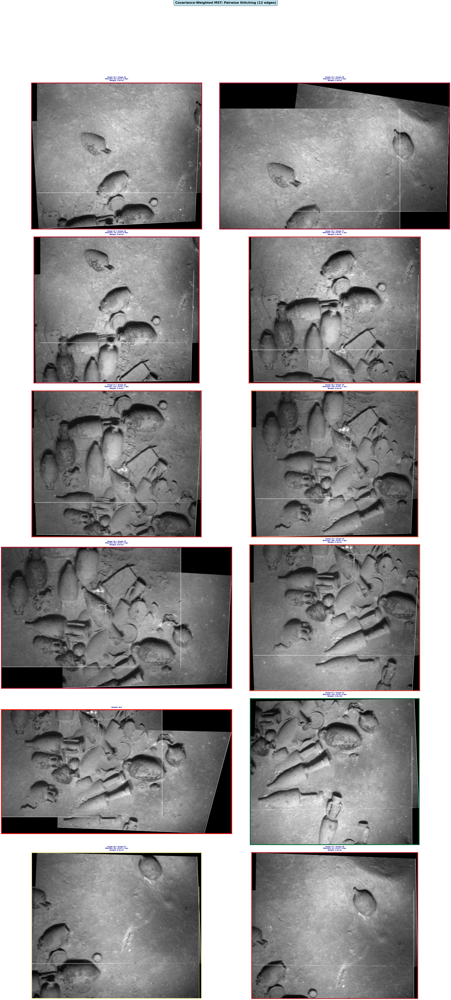

In [ ]:
# Show only stitched image pairs
show_pairwise_stitches(images, mst_pairwise_data)


Progressive build starting from Image 20
Traversal order: [20, 19, 22, 18, 21, 17, 23, 16, 15, 14, 28, 27, 26]


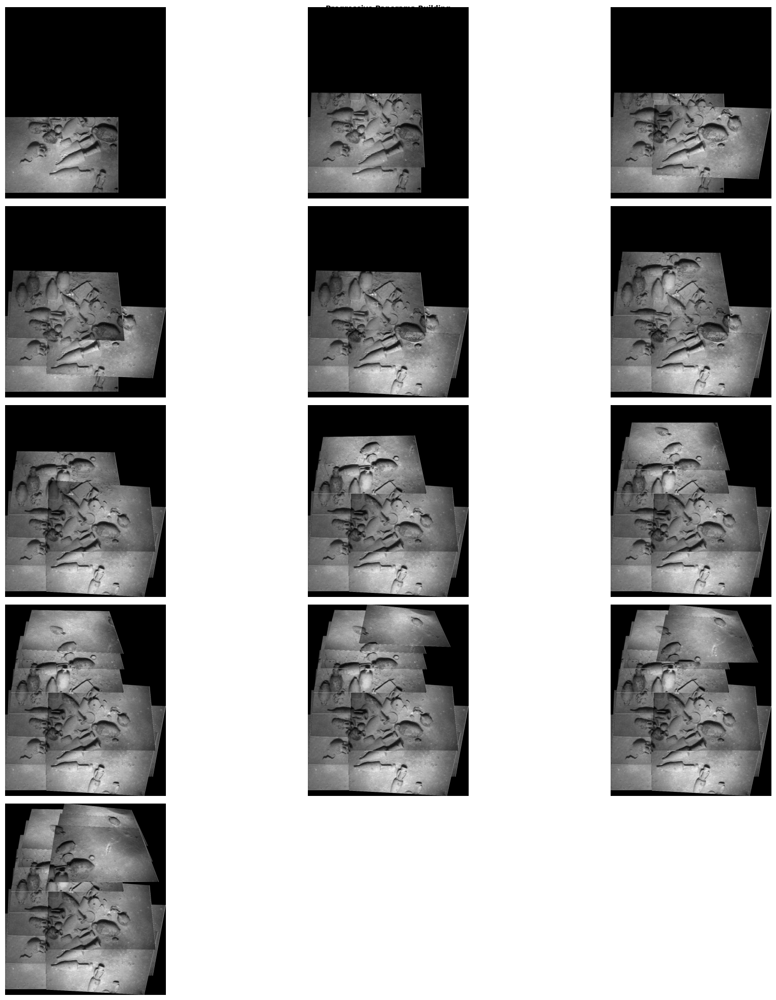

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
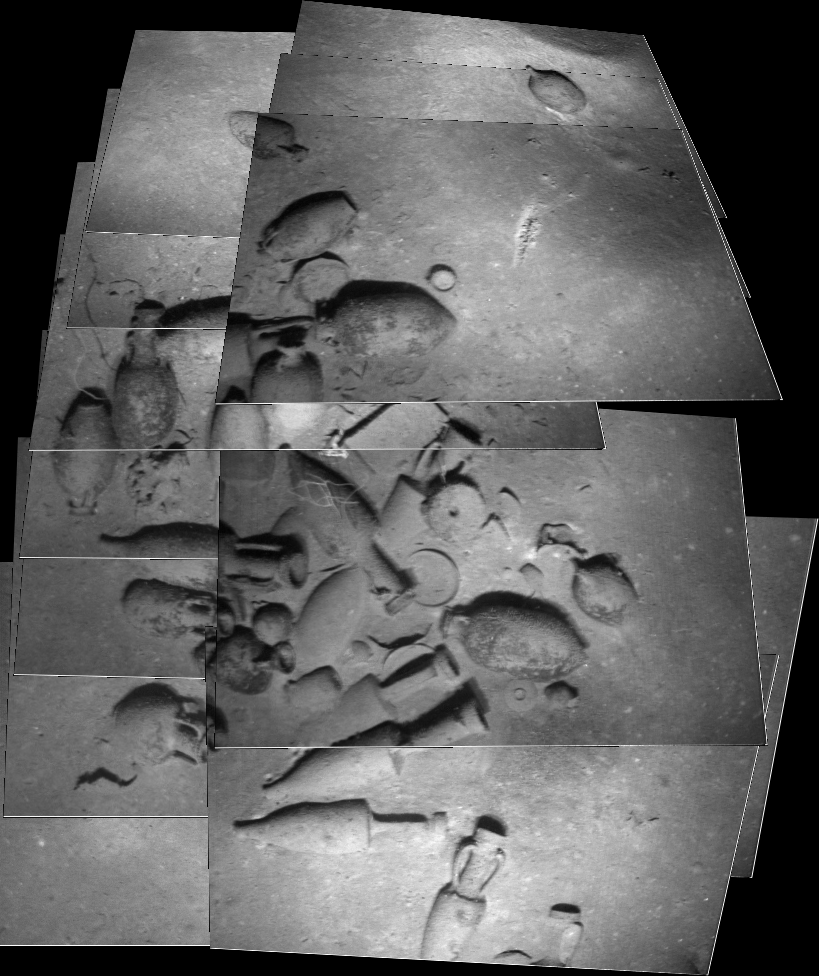

In [ ]:
# Build progressive panorama using MST and get transforms
build_panorama_progressive(images, mst_pairwise_data, mst_graph)


Step 6: Final MST-Based Panorama
Computing the final panorama using all MST edges. This serves as the baseline for comparison with optimized versions.

In [ ]:
final_panorama, transforms, ref_idx = build_panorama_final(images, mst_pairwise_data, mst_graph)

if final_panorama is not None:
    print(f"MST-based panorama complete! Size: {final_panorama.shape}")
else:
    print("Failed to build MST-based panorama")
    raise ValueError("Panorama construction failed")


MST-based panorama complete! Size: (1116, 831)


## Step 7: 2D Position Graph

Extracting and visualizing the 2D positions of each image based on the homography transformations. This graph shows the spatial layout of images in the panorama coordinate system.



Computing absolute image positions...


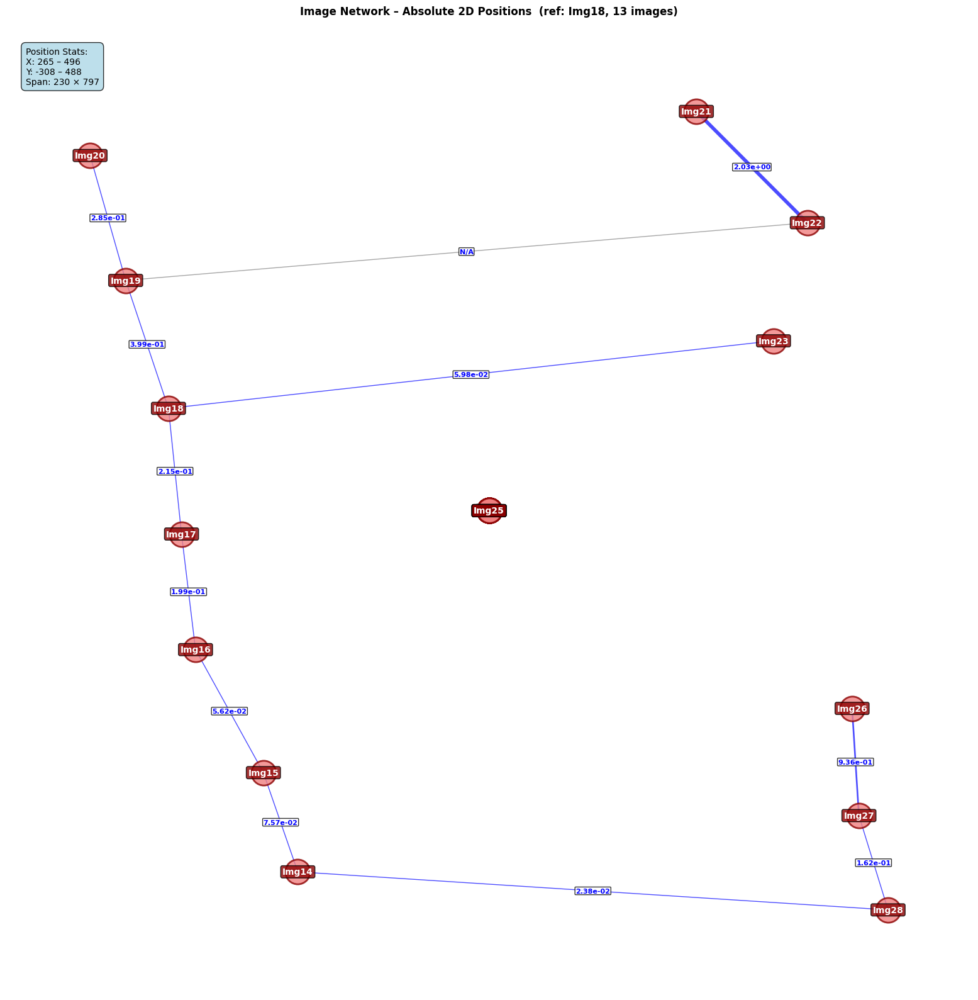


ABSOLUTE IMAGE POSITIONS
Reference: Img18
  Img14: (   325.3,   -270.4)
  Img15: (   315.4,   -171.4)
  Img16: (   295.8,    -48.7)
  Img17: (   291.8,     66.6)
  Img19: (   275.7,    319.6)
  Img20: (   265.4,    444.2)
  Img21: (   440.3,    488.2)
  Img22: (   472.3,    377.2)
  Img23: (   462.5,    259.4)
  Img26: (   485.2,   -107.3)
  Img27: (   487.2,   -214.3)
  Img28: (   495.6,   -308.4)


In [ ]:
# Show position graph with absolute 2D positions
if transforms and ref_idx is not None:
    initial_positions = show_position_graph(images, mst_pairwise_data, mst_graph, transforms, ref_idx)
else:
    raise ValueError("Failed to compute transforms")


## Step 8: GTSAM 2D Position Optimization

Using GTSAM (Georgia Tech Smoothing and Mapping) to optimize the 2D positions of images. This optimization:
- Uses covariance information from homography estimation
- Minimizes position inconsistencies
- Produces a globally consistent layout


In [ ]:
if initial_positions and len(initial_positions) > 1:
    print("\n" + "="*80)
    print("GTSAM 2D POSITION OPTIMIZATION")
    print("="*80)

    # Optimize 2D positions using GTSAM with covariance information
    optimized_positions = gtsam_optimize_2d_positions(images, mst_pairwise_data, initial_positions, ref_idx)
else:
    raise ValueError("Insufficient position data for optimization")



GTSAM 2D POSITION OPTIMIZATION

GTSAM 2D POSITION OPTIMIZATION
  Image 18: 3 connections → anchor σ=50.0
  Image 16: 2 connections → anchor σ=20.0
  Image 22: 1 connections → anchor σ=8.0
  Image 21: 2 connections → anchor σ=20.0
  Image 19: 1 connections → anchor σ=8.0
  Image 15: 2 connections → anchor σ=20.0
  Image 20: 1 connections → anchor σ=8.0
  Image 14: 2 connections → anchor σ=20.0
  Image 13: 2 connections → anchor σ=20.0
  Image 27: 2 connections → anchor σ=20.0
  Image 26: 2 connections → anchor σ=20.0
  Image 25: 1 connections → anchor σ=8.0
Factor (13,14): discrepancy=39.1px, inflation=2.95x, σ=(7.45,7.73)
Factor (13,27): discrepancy=119.6px, inflation=6.98x, σ=(41.90,17.08)
Factor (14,15): discrepancy=15.4px, inflation=1.77x, σ=(5.68,4.84)
Factor (15,16): discrepancy=3.3px, inflation=1.16x, σ=(1.91,1.77)
Factor (16,17): discrepancy=6.1px, inflation=1.31x, σ=(2.26,1.69)
Factor (17,18): discrepancy=5.8px, inflation=1.29x, σ=(1.49,1.40)
Factor (17,22): discrepancy=31.0px

## Step 9: Original vs. Optimized Positions

Comparing the initial positions (from sequential homographies) with GTSAM-optimized positions. The optimization typically reduces drift and improves global consistency.



POSITION COMPARISON: ORIGINAL vs GTSAM-OPTIMIZED


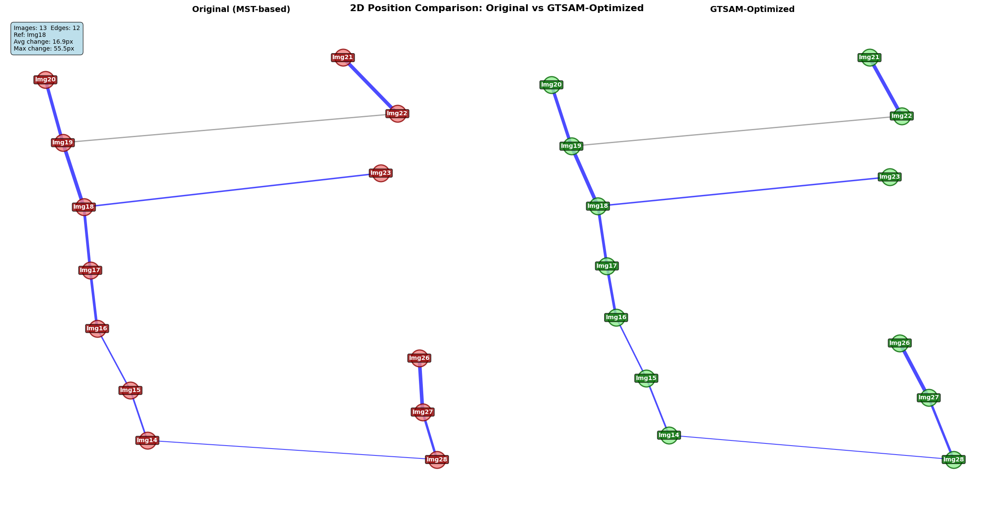


Image    Original (x,y)         Optimized (x,y)        Δ (px)
----------------------------------------------------------------------
Img14    (  325.3, -270.4)    (  333.9, -306.3)        36.9
Img15    (  315.4, -171.4)    (  319.2, -182.5)        11.7
Img16    (  295.8,  -48.7)    (  299.7,  -50.4)         4.3
Img17    (  291.8,   66.6)    (  293.8,   61.8)         5.2
Img18    (  288.0,  192.0)    (  288.0,  192.0)         0.0
Img19    (  275.7,  319.6)    (  270.9,  322.5)         5.6
Img20    (  265.4,  444.2)    (  258.0,  456.0)        13.9
Img21    (  440.3,  488.2)    (  463.3,  515.2)        35.4
Img22    (  472.3,  377.2)    (  484.1,  388.2)        16.1
Img23    (  462.5,  259.4)    (  476.3,  255.6)        14.3
Img26    (  485.2, -107.3)    (  482.8, -105.8)         2.8
Img27    (  487.2, -214.3)    (  501.5, -225.0)        17.9
Img28    (  495.6, -308.4)    (  517.6, -359.3)        55.5


{17: array([287.99994147, 191.99996906]),
 18: array([270.87006098, 322.46921487]),
 16: array([293.80655926,  61.84375011]),
 22: array([476.30786389, 255.58420842]),
 21: array([484.09264012, 388.18445801]),
 19: array([257.97618625, 455.95622103]),
 15: array([299.7328278 , -50.35593779]),
 20: array([463.2639    , 515.16057444]),
 14: array([ 319.23029645, -182.45286867]),
 13: array([ 333.88751187, -306.34069868]),
 27: array([ 517.58176522, -359.34314773]),
 26: array([ 501.49767517, -225.03940437]),
 25: array([ 482.82192882, -105.80453064])}

In [ ]:
# Display comparison between original and optimized positions
show_position_comparison(images, mst_pairwise_data, initial_positions,
                       optimized_positions, ref_idx)


## Step 10: Updating Homographies with Optimized Positions

Recomputing homographies based on the GTSAM-optimized 2D positions. This creates new transformations that are globally consistent while maintaining local image quality.


In [ ]:
print("\n" + "="*80)
print("UPDATING HOMOGRAPHIES WITH GTSAM-OPTIMIZED POSITIONS")
print("="*80)



UPDATING HOMOGRAPHIES WITH GTSAM-OPTIMIZED POSITIONS


# Update homographies using optimized positions

---




In [ ]:
updated_transforms = update_homographies_with_optimized_positions(
    images, transforms, initial_positions, optimized_positions, ref_idx)



UPDATING HOMOGRAPHIES WITH GTSAM POSITIONS
Img19: Δ=(   -4.8,    2.8)
Img17: Δ=(    2.0,   -4.8)
Img23: Δ=(   13.8,   -3.8)
Img22: Δ=(   11.8,   11.0)
Img20: Δ=(   -7.4,   11.7)
Img16: Δ=(    3.9,   -1.6)
Img21: Δ=(   23.0,   26.9)
Img15: Δ=(    3.8,  -11.0)
Img14: Δ=(    8.6,  -35.9)
Img28: Δ=(   22.0,  -51.0)
Img27: Δ=(   14.3,  -10.8)
Img26: Δ=(   -2.4,    1.5)
Updated 13 homographies.


In [ ]:
def update_transforms_with_gtsam(original_transforms, initial_positions,
                                  optimized_positions, ref_idx):
    updated = {}

    ref_initial   = np.array(initial_positions[ref_idx])
    ref_optimized = np.array(optimized_positions[ref_idx])

    # Compute scale factor between GTSAM space and pixel space
    scales = []
    for idx in initial_positions:
        if idx == ref_idx:
            continue
        init_pos = np.array(initial_positions[idx])
        opt_pos  = np.array(optimized_positions[idx])

        dist_init = np.linalg.norm(init_pos - ref_initial)
        dist_opt  = np.linalg.norm(opt_pos  - ref_optimized)

        if dist_opt > 1e-6:
            scales.append(dist_init / dist_opt)

    scale = np.median(scales)  # robust scale estimate
    print(f"Estimated scale factor (pixel/gtsam): {scale:.4f}")

    for idx, H_original in original_transforms.items():
        if idx not in optimized_positions:
            updated[idx] = H_original
            continue

        init_pos = np.array(initial_positions[idx])
        opt_pos  = np.array(optimized_positions[idx])

        # Scale optimized positions to pixel space before computing delta
        delta_initial   = init_pos - ref_initial
        delta_optimized = (opt_pos - ref_optimized) * scale  # ← scale applied here

        dx = delta_optimized[0] - delta_initial[0]
        dy = delta_optimized[1] - delta_initial[1]

        print(f"  Image {idx}: correction dx={dx:.2f}, dy={dy:.2f}")

        T_correction = np.array([
            [1, 0, dx],
            [0, 1, dy],
            [0, 0,  1]
        ], dtype=np.float64)

        updated[idx] = T_correction @ H_original

    return updated

In [ ]:
# ✅ Call it here — transforms comes from build_panorama_final above
updated_transforms = update_transforms_with_gtsam(
    transforms,           # original homographies from build_panorama_final
    initial_positions,    # positions before GTSAM
    optimized_positions,  # positions after GTSAM
    ref_idx               # reference image (17)
)

Estimated scale factor (pixel/gtsam): 0.9580
  Image 17: correction dx=0.00, dy=0.00
  Image 18: correction dx=-4.06, dy=-2.64
  Image 16: correction dx=1.80, dy=0.68
  Image 22: correction dx=5.85, dy=-6.47
  Image 21: correction dx=3.55, dy=2.77
  Image 19: correction dx=-6.15, dy=0.62
  Image 15: correction dx=3.44, dy=8.54
  Image 20: correction dx=15.61, dy=13.34
  Image 14: correction dx=2.53, dy=4.73
  Image 13: correction dx=6.65, dy=-14.98
  Image 27: correction dx=12.35, dy=-27.81
  Image 26: correction dx=5.34, dy=6.75
  Image 25: correction dx=-10.58, dy=14.06


## Step 11: Building Panorama with Position-Optimized Homographies

Creating a new panorama using the updated homographies. This panorama should have better global alignment than the original MST-based version.


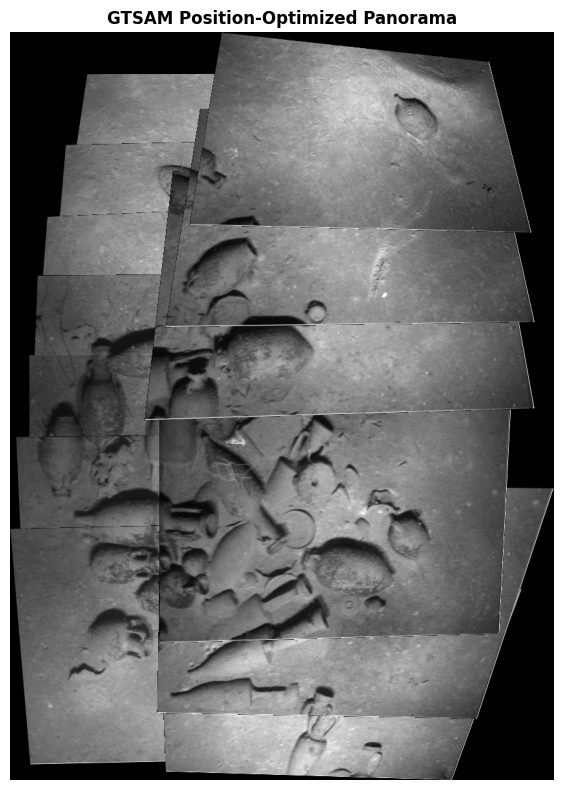

GTSAM position-optimized panorama complete! Size: (1157, 841)


In [ ]:
# Build and display panorama with updated homographies
if updated_transforms:
    gtsam_position_panorama = build_panorama_with_updated_homographies(
        images, updated_transforms, "GTSAM Position-Optimized Panorama")

    if gtsam_position_panorama is not None:
        print(f"GTSAM position-optimized panorama complete! Size: {gtsam_position_panorama.shape}")
    else:
        print("Failed to build GTSAM position-optimized panorama")
else:
    raise ValueError("Failed to update transforms")
